# Python en TP de Physique-Chimie (extrait)
<a id=toc2></a>

Le but de ce notebook est de vous rappeler toutes les possibilités intéressantes que vous offre Python en TP de Physique-Chimie.

<h1>Table des Matières<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Python-en-TP-de-Physique-Chimie-(extrait)" data-toc-modified-id="Python-en-TP-de-Physique-Chimie-(extrait)-0"><span class="toc-item-num">0&nbsp;&nbsp;</span>Python en TP de Physique-Chimie (extrait)</a></span></li><li><span><a href="#Réaliser-des-calculs-mathématiques-utiles" data-toc-modified-id="Réaliser-des-calculs-mathématiques-utiles-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Réaliser des calculs mathématiques utiles</a></span><ul class="toc-item"><li><span><a href="#Résoudre-une-équation-différentielle" data-toc-modified-id="Résoudre-une-équation-différentielle-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Résoudre une équation différentielle</a></span><ul class="toc-item"><li><span><a href="#Présentation" data-toc-modified-id="Présentation-1.1.1"><span class="toc-item-num">1.1.1&nbsp;&nbsp;</span>Présentation</a></span></li><li><span><a href="#1er-exemple-simple-:-charge-d'un-condensateur" data-toc-modified-id="1er-exemple-simple-:-charge-d'un-condensateur-1.1.2"><span class="toc-item-num">1.1.2&nbsp;&nbsp;</span>1er exemple simple : charge d'un condensateur</a></span></li><li><span><a href="#2ème-exemple-:-équation-non-linéaire-d'ordre-2---le-pendule-simple" data-toc-modified-id="2ème-exemple-:-équation-non-linéaire-d'ordre-2---le-pendule-simple-1.1.3"><span class="toc-item-num">1.1.3&nbsp;&nbsp;</span>2ème exemple : équation non linéaire d'ordre 2 - le pendule simple</a></span></li><li><span><a href="#3ème-exemple-:-l'oscillateur-à-Pont-de-Wien" data-toc-modified-id="3ème-exemple-:-l'oscillateur-à-Pont-de-Wien-1.1.4"><span class="toc-item-num">1.1.4&nbsp;&nbsp;</span>3ème exemple : l'oscillateur à Pont de Wien</a></span></li></ul></li></ul></li><li><span><a href="#Exemples-de-simulations-intéressantes" data-toc-modified-id="Exemples-de-simulations-intéressantes-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Exemples de simulations intéressantes</a></span><ul class="toc-item"><li><span><a href="#Le-pendule-animé" data-toc-modified-id="Le-pendule-animé-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Le pendule animé</a></span></li></ul></li></ul></div>

# Réaliser des calculs mathématiques utiles

<a id=equadiff></a>
## Résoudre une équation différentielle
[Retour à la table des matières](#toc2)

Dans cette partie, nous allons voir comment résoudre simplement une équation-différentielle :
* [Présentation de la résolution](#equadiff_pres)
* [Exemple 1 : charge d'un circuit RC](#equadiff_RC)
* [Exemple 2 : oscillation d'un pendule](#equadiff_pendule)
* [Exemple 3 : oscillateur à Pont de Wien](#equadiff_wien)

<a id =equadiff_pres></a>
### Présentation
[Revenir au menu de la résolution des équations différentielles](#equadiff)

La résolution d'équations différentielles peut se faire efficacement à l'aide de la fonction ```odeint``` du module ```scipy.integrate```. Pour l'utiliser, il faut écrire le problème à résoudre sous la forme :
$$ \frac{dY}{dt}=F(Y,t)$$
$$Y(0)=Y_0$$

Si cette résolution semble a priori être uniquement celle d'une équation d'ordre 1, elle permet en fait de résoudre une équation d'ordre $N$ : il suffit alors que $Y$ soit un vecteur à $N$ éléments. Nous l'étudierons dans les exemples.

A chaque fois, il faudra donc: 
1. Mettre le problème sous la forme demandée et en déduire la fonction $F$
2. Définir la fonction $F$ sous Python
3. Utiliser ```y=odeint(F,y0,t,args=())``` où ```args``` correspond aux arguments de $F$ qui ne sont ni $Y$ ni $t$ (et correspondent à des paramètres du problème par exemple). ```t``` est le tableau ```numpy``` correspondant aux instants où l'on cherche $Y$.

<a id =equadiff_RC></a>
### 1er exemple simple : charge d'un condensateur
[Revenir au menu de la résolution des équations différentielles](#equadiff)

On cherche à déterminer la tension $s$ aux bornes d'un condensateur lors de la charge d'un circuit $RC$, régi par l'équation différentielle :
$$s+\tau \frac{ds}{dt}=E$$
$$s(0)=0$$

Le problème se met donc sous la forme :
$$\frac{ds}{dt}=\frac{E-s}{\tau}=F(s,t)$$
$$s(0)=0$$

Définissons $F$ :

In [1]:
def F(s,t,E,tau): # on met les paramètres du problème (E,tau) en dernier
    return (E-s)/tau

Exécutons la fonction ```odeint``` et traçons le résultat :

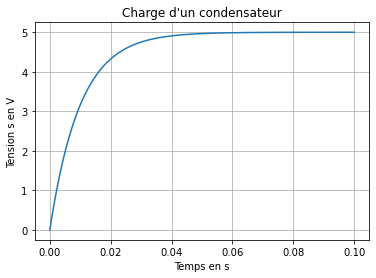

In [2]:
from scipy.integrate import odeint
from scipy.integrate import odepack
import numpy as np
import matplotlib.pyplot as plt

s0=0
tau=10e-3
E=5
t=np.linspace(0,10*tau,1000)

y=odeint(F,s0,t,args=(E,tau))

plt.figure()
plt.plot(t,y)
plt.xlabel("Temps en s")
plt.ylabel("Tension s en V")
plt.grid()
plt.title("Charge d'un condensateur")
plt.show()

<a id =equadiff_pendule></a>
### 2ème exemple : équation non linéaire d'ordre 2 - le pendule simple
[Revenir au menu de la résolution des équations différentielles](#equadiff)

On s'intéresse désormais à l'équation non linéaire d'ordre 2 modélisation les oscillations d'un pendule de longueur $l$, de masse $m$ et soumis à une force de frottement fluide de coefficient $h$ :
$$\frac{d^2 \theta}{dt^2}+\frac{h}{m} \frac{d\theta}{dt}+\frac{g}{l}\sin(\theta)=0$$
On poser les conditions initiales suivantes :
$$\theta(t=0)=\theta_0$$
$$\frac{d\theta}{dt}(t=0)=\omega_0$$
Pour se ramener au problème d'ordre 1 résolu par ```odeint```, on va poser le vecteur :
$$Y= \begin{bmatrix} \theta \\ \dot{\theta}\end{bmatrix}$$
On déduit :
$$\dot{Y}= \begin{bmatrix} \dot{\theta} \\ \ddot{\theta} \end{bmatrix}=\begin{bmatrix} \dot{\theta} \\ -\frac{h}{m} \dot{\theta}-\frac{g}{l}\sin(\theta) \end{bmatrix} = F(Y,t)$$
Définissons $F$ sous Python :

In [3]:
def F(Y,t,h,m,g,l):
    return Y[1],-h/m*Y[1]-g/l*sin(Y[0])

Résolvons ensuite l'équation :

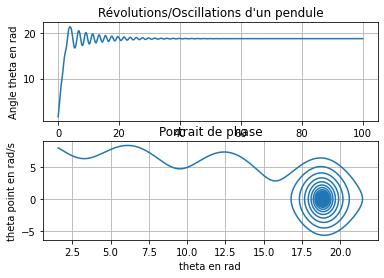

In [4]:
from scipy.integrate import odeint
import numpy as np
import matplotlib.pyplot as plt
from math import sin

y0=[3.14/2,8]

m=0.1
l=1
g=9.8
h=0.02

t=np.linspace(0,100,10000)

y=odeint(F,y0,t,args=(h,m,g,l))

# Tracés
plt.figure()
plt.subplot(211)
plt.plot(t,y[:,0])
plt.xlabel("t en s")
plt.ylabel("Angle theta en rad")
plt.title("Révolutions/Oscillations d'un pendule")
plt.grid()

plt.subplot(212)
plt.plot(y[:,0],y[:,1])
plt.xlabel("theta en rad")
plt.ylabel("theta point en rad/s")
plt.title("Portrait de phase")
plt.grid()
plt.show()

On peut maintenant s'amuser un peu plus en animant tout cela : [rendez-vous ici](#pendule)

<a id =equadiff_wien></a>
### 3ème exemple : l'oscillateur à Pont de Wien
[Revenir au menu de la résolution des équations différentielles](#equadiff)

Dans le TP sur l'oscillateur quasi-sinusoïdal à Pont de Wien, on montre que la tension de sortie de l'amplificateur opérationnel $s$ était régie par le jeu d'équations suivant :
* Si $|s| < V_{sat}$ :
$$ s + \frac{1-\frac{K}{3}}{Q\omega_0} \dot{s} + \frac{1}{\omega_0^2}\ddot{s} = 0$$
* sinon :
$$ s + \frac{1}{Q\omega_0} \dot{s} + \frac{1}{\omega_0^2}\ddot{s} = 0$$

où :
* $K$ est le coefficient de l'amplificateur utilisé
* $Q$ et $\omega_0$ sont respectivement le facteur de qualité et la pulsation caractéristique du filtre passe-bande de Wien.

Voyons ci-dessous comment résoudre ce problème, en posant :
$$Y= \begin{bmatrix} s \\ \dot{s}\end{bmatrix}$$
et 
$$\dot{Y}=F(Y,t)$$

Donner la valeur de K :3.3


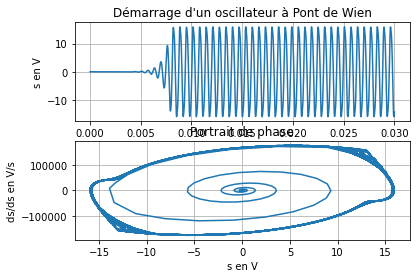

In [5]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt

#définissons F

def F(Y,t,Q,w0,K,Vsat):
    if abs(Y[0])<Vsat:
        d2y=-w0**2*Y[0]-w0/Q*(1-K/3)*Y[1]
    else :
        d2y=-w0**2*Y[0]-w0/Q*Y[1]
    return Y[1],d2y

#posons les constantes

Q=1/3
R=1e3
C=1e-7
w0=1/(R*C)
Vsat=13

K=float(input("Donner la valeur de K :"))

#résolvons

t=np.linspace(0,30e-3,1000)
Y0=[0.0001,0.0001]

Y=odeint(F,Y0,t,args=(Q,w0,K,Vsat))

#traçons

plt.figure()
plt.subplot(211)
plt.plot(t,Y[:,0])
plt.grid()
plt.xlabel("Temps en s")
plt.ylabel ("s en V")
plt.title("Démarrage d'un oscillateur à Pont de Wien")

plt.subplot(212)
plt.plot(Y[:,0],Y[:,1])
plt.grid()
plt.xlabel("s en V")
plt.ylabel("ds/ds en V/s")
plt.title("Portrait de phase")
plt.show()

# Exemples de simulations intéressantes

<a id=pendule></a>

## Le pendule animé
[Retour à la table des matières](#toc2)

Avant d'étudier cette partie, il faut s'assurer d'avoir revu et compris [comment résoudre une équation différentielle avec Python.](#equadiff) On pourra passer un peu de temps sur l'exemple de résolution du pendule.

C'est bon ? Alors allons-y. Le but va être de fabriquer cette animation :

<img src="pendule.gif" width=50%>


Choisissons d'abord un angle initial et une vitesse initiale pour le pendule :

In [6]:
th0=float(input("Donner la valeur de l'angle initial en rad :"))
w00=float(input("Donner la valeur de la vitesse initiale en m/s :"))

Donner la valeur de l'angle initial en rad :2
Donner la valeur de la vitesse initiale en m/s :9


Résolvons l'équation différentielle pour trouver $\theta$ et $\dot{\theta}$ à tout instant :

In [10]:
import numpy as np
from scipy.integrate import odeint
from math import sin, cos
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['figure.figsize']=[8.0,8.0]

import numpy as np
import matplotlib.pyplot as plt

from IPython.display import HTML

#définissons la fonction F associée à l'équation différentielle
def F(Y,t,h,m,g,l):
    return Y[1],-h/m*Y[1]-g/l*sin(Y[0])

# définissons les paramètres du problème et les conditions initiales
y0=[th0,w00]

m=0.1
l=1
g=9.8
h=0.02

t=np.linspace(0,100,10000)
dt=t[1]-t[0]

#résolvons l'équation différentielle
Y=odeint(F,y0,t,args=(h,m,g,l))

A l'aide de la fonction ```pos```, nous déterminons les coordonnées de l'extrémité du pendule. Nous créeons aussi les listes ```temps```, ```theta``` et ```thetapoint``` qui grandiront au cours de l'animation et qui permettront de voir les graphes se tracer progressivement.

In [11]:
def pos(theta):
    return sin(theta[-1]),-cos(theta[-1])

On peut alors commencer à coder l'animation : 
* on commence par préparer la figure (l'astuce est de laisser vide les arguments de la fonction ```plot```, et de les remplir avec ```set_data``` à chaque itération).
* on crée ensuite une fonction ```ìnitial``` initialisant le tracé
* on crée enfin la fonction ```animate``` qui s'exécutera en boucle

On peut ensuite démarrer l'animation. Préparons tout d'abord la figure :

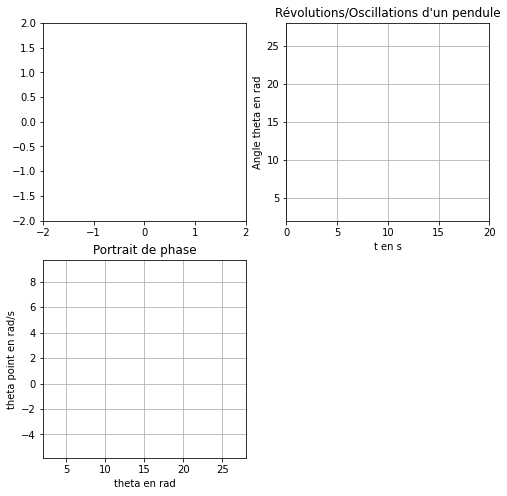

In [12]:
import matplotlib.animation as animation

fig=plt.figure()
fig.clf()

plt.subplot(221)
l01, =plt.plot([],[],'-')
plt.xlim(-2,2)
plt.ylim(-2,2)

plt.subplot(222)
l1, =plt.plot([],[],'.-')#(t,y[:,0])
plt.xlim(0,20)
plt.ylim(np.min(Y[:,0]),np.max(Y[:,0]))
plt.xlabel("t en s")
plt.ylabel("Angle theta en rad")
plt.title("Révolutions/Oscillations d'un pendule")
plt.grid()

plt.subplot(223)
l2, =plt.plot([],[],'.-')#(y[:,0],y[:,1])
plt.xlabel("theta en rad")
plt.ylabel("theta point en rad/s")
plt.xlim(np.min(Y[:,0]),np.max(Y[:,0]))
plt.ylim(np.min(Y[:,1]),np.max(Y[:,1]))
plt.title("Portrait de phase")
plt.grid()

Et réalisons l'animation désormais :

In [13]:
theta=[Y[0,0]]
thetapoint=[Y[0,1]]
temps=[0]

#fonction d'initialisation
def initial():
    global theta
    global thetapoint
    global Y
    global temps
    a,b=pos(theta)
    l01.set_data([0,a],[0,b])
    l1.set_data(t,theta)
    l2.set_data(theta,thetapoint)

#fonction d'animation
def animate(i):
    global theta
    global thetapoint
    global Y
    global temps
    global dt
    global th0
    global w00
       
    temps.append(temps[-1]+5*dt)
    theta.append(Y[5*i,0])
    thetapoint.append(Y[5*i,1])
    a,b=pos(theta)
    l01.set_data([0,a],[0,b])
    l1.set_data(temps,theta)
    l2.set_data(theta,thetapoint)
    

HTML(animation.FuncAnimation(fig,animate,np.arange(1, int(len(t)/30)),repeat=False,init_func=initial).to_jshtml())
# c'est un peu long alors on s'arrête à 1/30 du temps total de calcul... modifiable si on a le temps...
# attention cela peut être long
